# Imports

In [12]:
import numpy as np 
import os 
import time
import matplotlib.pyplot as plt


import base64
from PIL import Image
import io


import tensorflow as tf 

from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPooling2D, Rescaling
from tensorflow.keras.layers import ZeroPadding2D, GlobalAveragePooling2D ,Dense,Flatten

from tensorflow.keras.callbacks import TensorBoard, ReduceLROnPlateau

from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.models import Sequential, Model,load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.losses import binary_crossentropy, BinaryCrossentropy

# Organizing Data

In [ ]:
%%bash
pip install kaggle
mkdir ~/.kaggle
cp kaggle.json ~/.kaggle/
chmod 600 ~/.kaggle/kaggle.json
sudo apt install unzip
kaggle competitions download -c dogs-vs-cats
mkdir data

mkdir Validate
mkdir Validate/cats
mkdir Validate/dogs
unzip -q dogs-vs-cats.zip -d data/
unzip -q data/test1.zip -d .
unzip -q data/train.zip -d .


mkdir train/cats
mkdir train/dogs

mv train/cat*.jpg train/cats/
mv train/dog*.jpg train/dogs/

mv test1 test

rm -r logs

In [6]:
def allinone(factor, path, path_v):

  cats = os.listdir(path + 'cats/')
  dogs = os.listdir(path + 'dogs/')

  mcount_c = len(cats)
  mcount_d = len(dogs)

  count_ls = [mcount_c, mcount_d]
  dir = [cats, dogs]

  f1 = int(len(cats)*factor)
  f2 = int(len(dogs)*factor)

  count01_ls = [f1,f2]
  lbls = ['cats', 'dogs']

  rename = 'mv {}/{} {}/{}.jpg'
  mv = 'mv {}/{}.jpg {}/'

  for j in range(2):
    for i in dir[j]:
      f = i.split('.')
      fcomm = rename.format(path + lbls[j], i, path + lbls[j], f[0]+f[1])
      os.system(fcomm)

  for j in range(2):
    for i in range(count01_ls[j]):
      rnd = str(np.random.randint(low=1,high=count_ls[j]-1))
      fcomm = mv.format(path + lbls[j], lbls[j][:-1]+rnd, path_v + lbls[j])
      os.system(fcomm)

  cats_v = os.listdir(path_v + 'cats/')
  dogs_v = os.listdir(path_v + 'dogs/')
  cats_t = os.listdir(path + 'cats/')
  dogs_t = os.listdir(path + 'dogs/')

  print('cats_v = {}'.format(len(cats_v)))
  print('dogs_v = {}'.format(len(dogs_v)))
  print('\n')
  print('\n')
  print('cats_t = {}'.format(len(cats_t)))
  print('dogs_t = {}'.format(len(dogs_t)))


In [ ]:
factor = 0.1
path = 'train/'
path_v = 'Validate/'

allinone(factor, path, path_v)

# {Training & Validation} DataSets & Specifiying batchsize

In [99]:
! rm -r "/content/train/.ipynb_checkpoints"
! rm -r "/content/Validate/.ipynb_checkpoints"
ds_train = image_dataset_from_directory(
    'train/',
    label_mode='binary',
    class_names=['cats', 'dogs'],
    color_mode='rgb',
    image_size=(224,224),
    batch_size=64,
    seed=42
)
ds_val = image_dataset_from_directory(
    'Validate/',
    class_names=['cats', 'dogs'],
    color_mode='rgb',
    image_size=(224,224),
    batch_size=100,
    seed=42
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

rm: cannot remove '/content/train/.ipynb_checkpoints': No such file or directory
rm: cannot remove '/content/Validate/.ipynb_checkpoints': No such file or directory
Found 22603 files belonging to 2 classes.
Found 2397 files belonging to 2 classes.


In [15]:
ds_train.class_names

['cats', 'dogs']

# From Scratch Implementation of ResNet

## Model Prep

### Functions

In [22]:
def Conv_Identity_block(X, filter_num, first=False, Conv=True):
    X_skip = X
    
    
    ###1st layer
    if Conv and not first:
        s = 2
    else:
        s = 1
        
    X = tf.keras.layers.Conv2D(filter_num, (1,1), strides=(s, s))(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.Activation('relu')(X)
    
    ###2nd layer
    X = tf.keras.layers.Conv2D(filter_num, (3,3), padding='same')(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.Activation('relu')(X)
    
    ###3rd layer
    X = tf.keras.layers.Conv2D(filter_num*4, (1,1), activation='relu')(X)
    X = tf.keras.layers.BatchNormalization()(X)
    
    
    ###Conv or Identity
    if Conv:
        X_skip = tf.keras.layers.Conv2D(filter_num*4, (1,1), strides=(s,s), activation='relu')(X_skip)
        X_skip = tf.keras.layers.BatchNormalization()(X_skip)

        
    ###4th layer
    
    X = tf.keras.layers.Add()([X, X_skip])
    X = tf.keras.layers.Activation('relu')(X)
    
    
    return X

In [23]:
###ResNet50
def ResNet50(input_shape=(224,224,3)):
    X_input = tf.keras.layers.Input(input_shape,dtype=np.float16)

    X = Rescaling(scale=1./255)(X_input)
    X = tf.keras.layers.ZeroPadding2D((3,3))(X)
    
    X = tf.keras.layers.Conv2D(64, (7,7), strides=(2,2))(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.Activation('relu')(X)
    X = tf.keras.layers.ZeroPadding2D((1,1))(X)
    X = tf.keras.layers.MaxPooling2D((3,3), strides=2)(X)
    
    
    
    num = [3, 4, 6, 3]
    filter_size = 64
    First = True
    layer_num = 0
    
    for i in num:
        for j in range(i):
            if j == 0:
                X = Conv_Identity_block(X, filter_size, First)
                First = False
            else:
                X = Conv_Identity_block(X, filter_size, Conv=False)
        filter_size *= 2
        layer_num += 1
    
    X = tf.keras.layers.GlobalAveragePooling2D()(X)
    X = tf.keras.layers.Flatten()(X)
    X = tf.keras.layers.Dense(256, activation='relu')(X)
    X = tf.keras.layers.Dense(128, activation='relu')(X)
    output_tensor = tf.keras.layers.Dense(1, activation='sigmoid')(X)
    model = Model(inputs=X_input, outputs=output_tensor, name='ResNet50')
    
    return model

### Building Model

In [ ]:
Base_Model = ResNet50(input_shape=(224,224,3))

## Model Compile

### Callbacks

In [ ]:
seconds = time.time()
local_time = time.ctime(seconds)
us_time = local_time.split()[3]
hr = int(us_time[:2]) + 2
tm = str(hr) + us_time[2:]
name = 'ResNet {}'.format(tm)
tensorboard = TensorBoard(log_dir='logs/{}'.format(name))

In [ ]:
LR_callback = ReduceLROnPlateau(mode='min', verbose=1, patience=2, min_delta=0.001)

### Compiling

In [25]:
Base_Model.compile(loss=BinaryCrossentropy(),
                   optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                   metrics=['accuracy'])

## Model Fit

In [26]:
Base_Model.fit(ds_train, validation_data=ds_val, callbacks=[tensorboard, LR_callback], epochs=10)

Epoch 1/10
354/354 [==============================] - 259s 697ms/step - loss: 0.6570 - accuracy: 0.6435 - val_loss: 0.9162 - val_accuracy: 0.5086 - lr: 0.0010
Epoch 2/10
354/354 [==============================] - 251s 706ms/step - loss: 0.5274 - accuracy: 0.7374 - val_loss: 1.0731 - val_accuracy: 0.5649 - lr: 0.0010
Epoch 3/10
354/354 [==============================] - 251s 708ms/step - loss: 0.4327 - accuracy: 0.7998 - val_loss: 0.5878 - val_accuracy: 0.7076 - lr: 0.0010
Epoch 4/10
354/354 [==============================] - 250s 705ms/step - loss: 0.3509 - accuracy: 0.8469 - val_loss: 0.4530 - val_accuracy: 0.8102 - lr: 0.0010
Epoch 5/10
354/354 [==============================] - 251s 707ms/step - loss: 0.2826 - accuracy: 0.8789 - val_loss: 0.7317 - val_accuracy: 0.6041 - lr: 0.0010
Epoch 6/10
354/354 [==============================] - ETA: 0s - loss: 0.2332 - accuracy: 0.9015
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
354/354 [=======================

## Tensorboard

In [27]:
%load_ext tensorboard
%tensorboard --logdir "logs/"

<IPython.core.display.Javascript object>

## Model Testing

In [ ]:
ds_train.class_names

['cats', 'dogs']

In [96]:
def plot_t(path, perfig, fig, model):
  f = os.listdir(path)
  length = len(f)
  for i in range(fig):
    x = plt.figure(i)
    plt.rcParams['figure.figsize'] = [13, 5]
    fig, axs = plt.subplots(1, perfig)
    rnd = np.random.randint(0, length, perfig)
    for k in range(perfig):
      image_name = f[rnd[k]]
      pred, img = get(image_name, path, model)
      if pred == 0:
        title = 'cat'
      else:
        title = 'dog'
      axs[k].imshow(img)
      axs[k].set_title(title)




def get(image_name, path, model):
  img = Image.open(path+image_name)
  img_x = img.resize((224,224))
  img_p = np.asarray(img_x)
  img_px = img_p.reshape((1,224,224,3))
  out = tf.convert_to_tensor(img_px)
  pred = model.predict(out)[0][0]
  ret = round(pred)
  return ret, img_x

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 720x360 with 0 Axes>

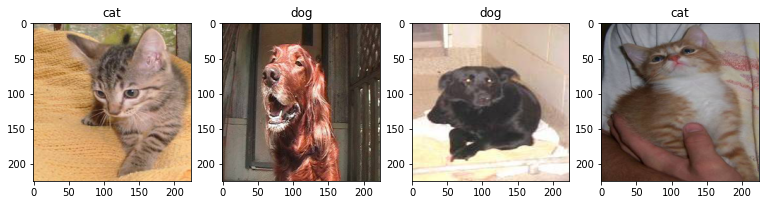

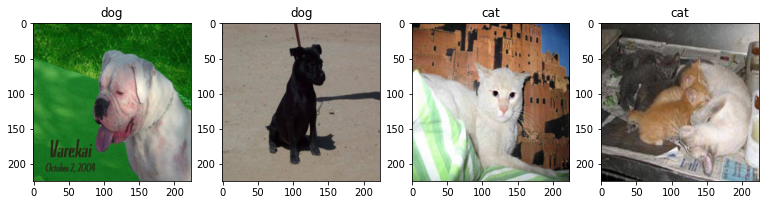

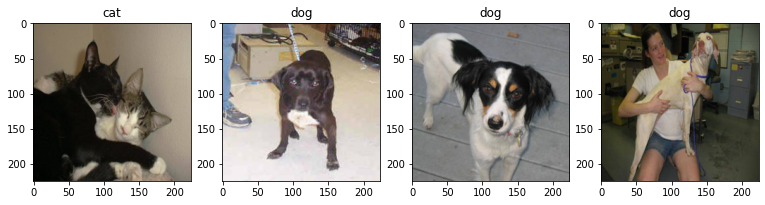

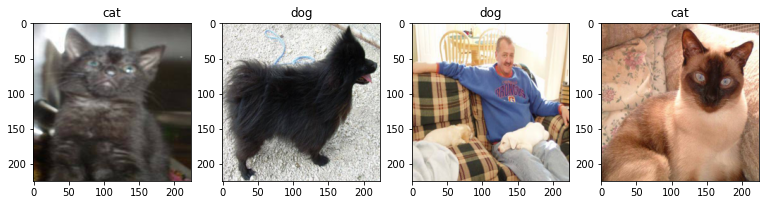

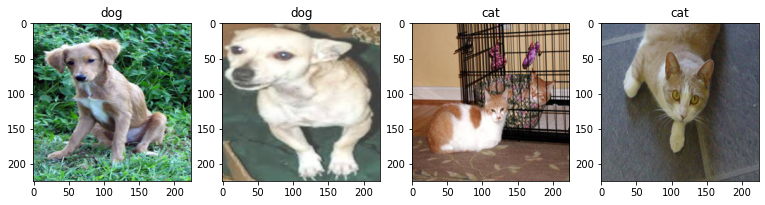

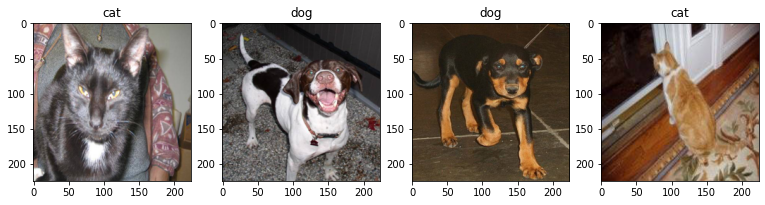

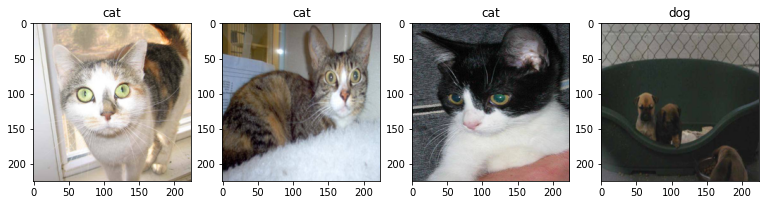

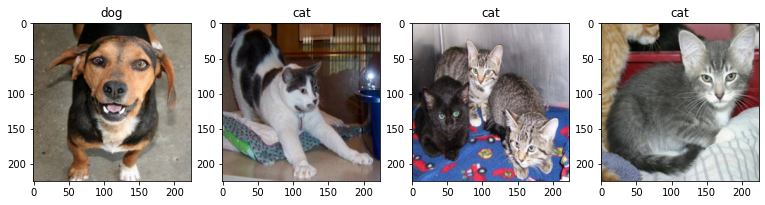

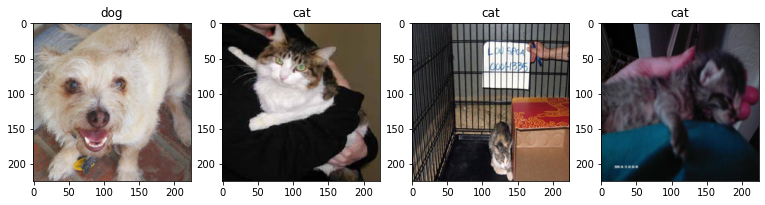

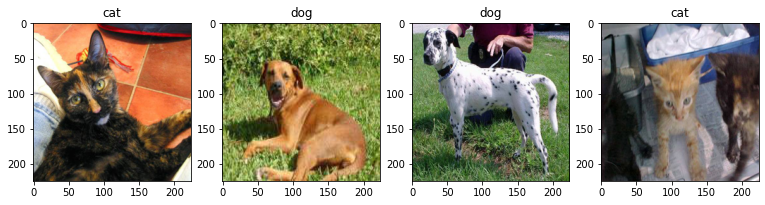

In [78]:
path = 'test/'
plot_t(path, 4, 10, Base_Model)

# Keras ResNet

##  Model Prep

In [79]:
PreModel = tf.keras.applications.ResNet50(include_top=False, 
                                          weights='imagenet', input_shape=(224,224,3), 
                                          classes=1)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

94781440/94765736 [==============================] - 1s 0us/step


In [80]:
for layer in PreModel.layers:
        layer.trainable=False

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [87]:
resnet_model_2 = Sequential()
resnet_model_2.add(PreModel)
resnet_model_2.add(tf.keras.layers.Flatten())
resnet_model_2.add(tf.keras.layers.Dense(512, activation='relu'))
resnet_model_2.add(tf.keras.layers.Dense(1, activation='sigmoid'))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
resnet_model_2.summary()

## Model Compile

In [89]:
resnet_model_2.compile(loss=BinaryCrossentropy(), 
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=['accuracy'])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model Fit

In [90]:
resnet_model_2.fit(ds_train, validation_data=ds_val, epochs=3)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Epoch 1/3
354/354 [==============================] - 85s 231ms/step - loss: 0.8465 - accuracy: 0.9631 - val_loss: 0.0882 - val_accuracy: 0.9716
Epoch 2/3
354/354 [==============================] - 82s 229ms/step - loss: 0.0228 - accuracy: 0.9915 - val_loss: 0.1037 - val_accuracy: 0.9704
Epoch 3/3
354/354 [==============================] - 84s 237ms/step - loss: 0.0075 - accuracy: 0.9973 - val_loss: 0.0915 - val_accuracy: 0.9754


## Model Test

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 936x360 with 0 Axes>

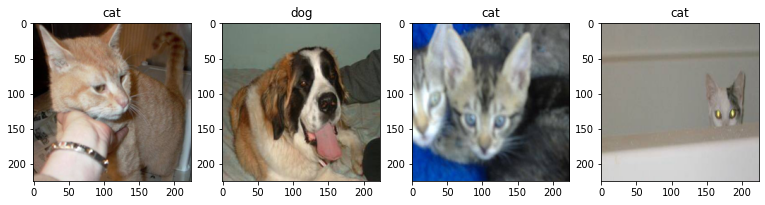

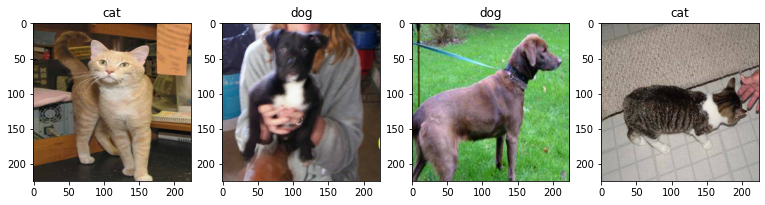

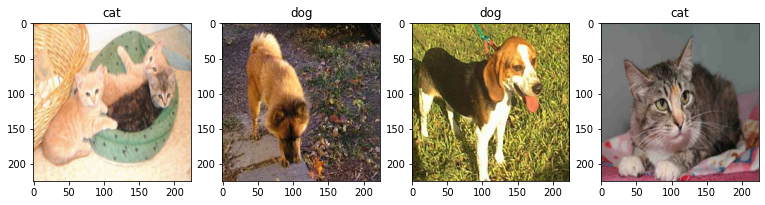

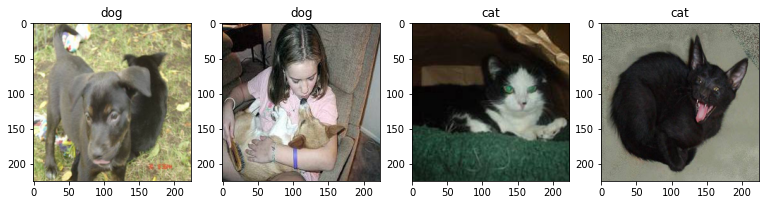

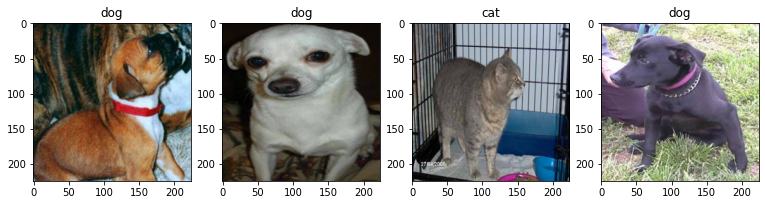

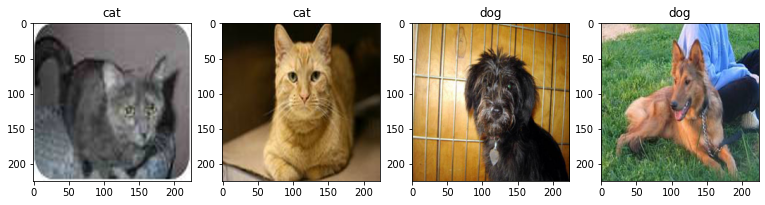

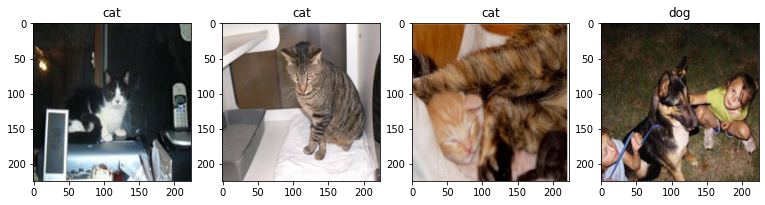

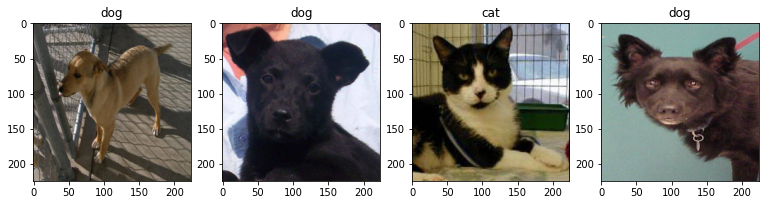

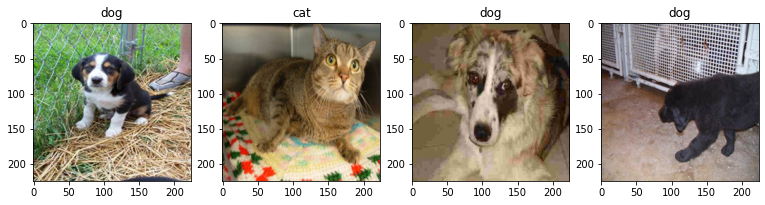

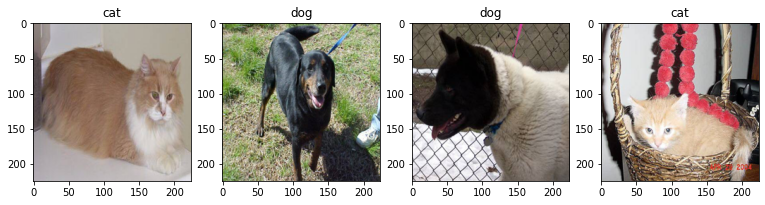

In [98]:
plot_t(path, 4, 10, resnet_model_2)